# Charting the Path to Sustainability: Integrating Land Sector Data with SDGs
## Task 3- Geospatial Analysis
### Land Sector Dataset Category; Administrative

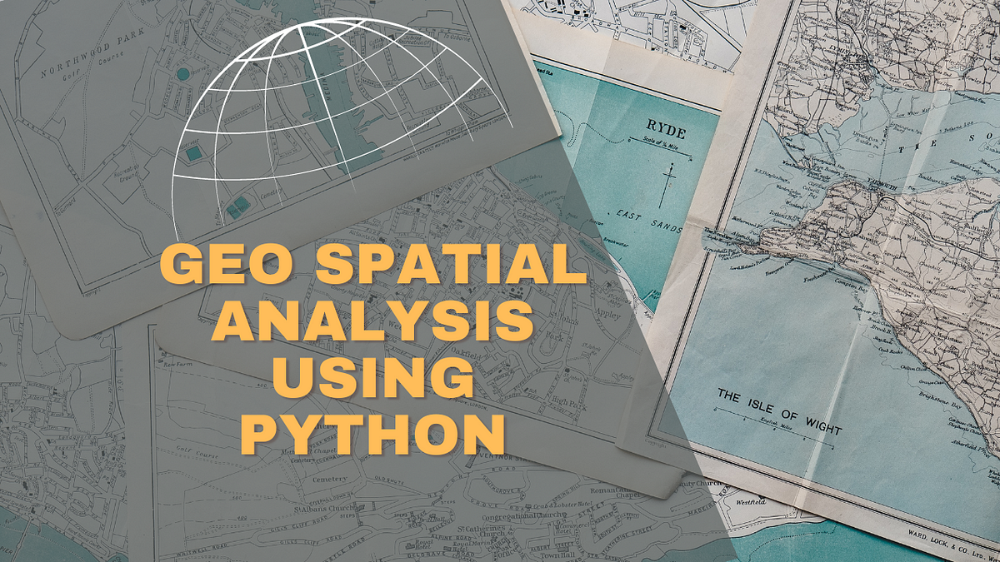

#### TABLE OF CONTENT

#### 1. INTRODUCTION
    1.0 OVERVIEW
    1.1 AIM

#### 2. REPOSITORY
    2.0 IMPORT LIBRARIES

#### 3. WORLD SOIL BOUNDARY
     3.O LOAD DATASET
     3.1 UNDERSTAND THE DATA
     3.2 EXPLORATORY DATA ANALYSIS

#### 4. PROTECTED AREAS
     4.O LOAD DATASET
     4.1 UNDERSTAND THE DATA
     4.2 EXPLORATORY DATA ANALYSIS

#### 5. ROADS
     5.O LOAD DATASET
     5.1 UNDERSTAND THE DATA
     5.2 EXPLORATORY DATA ANALYSIS


#### 6. GEOSPATIAL ANALYSIS
     6.0 SOIL DISTRIBUTION ANALYSIS
     6.1 SOIL ECOSYSTEMS & SERVICES MAPPING
     6.2 ROAD NETWORK ANALYSIS
     6.3 SPATIAL ANALYSIS

#### 7. SUMMARY & KEY FINDINGS

#### 8. REFERENCES

#### INTRODUCTION
    1.0 OVERVIEW

Geospatial analysis (geospatial data analysis) focuses on the study and exploration of geographical data. It involves using geographical information to understand patterns, relationships, and trends between different spatial features and attributes. It can answer various questions, such as where certain phenomena are more likely to occur, how human activities affect the environment, and the distribution of certain population groups. Geospatial analysis involves collecting, cleaning, and transforming geospatial data, creating maps and visualizations, and conducting statistical analysis to identify patterns and relationships.

Geospatial analysis is widely used in fields such as urban planning, environmental science, natural resource management, epidemiology, transportation planning, and many others. Geographic Information Systems (GIS) software is often used to perform these analyses, allowing analysts to manipulate, visualize, and analyze spatial data effectively.

In the context of this task, the dataset in focus pertains to the administrative land sector. It contains various subcategories of data, including information about the world soil boundary, a global database of protected areas, and global road coverage. 

    1.1 AIM

The aim of the task is to analyze analyze the spatial data to identify patterns, trends, and correlations within the administrative land sector dataset.

#### REPOSITORY
    2.0 IMPORT LIBRARIES

Importing libraries is a critical step before loading the dataset. It is critical to import only the libraries that you are certain you will need to work with your dataset. To import to libraries, use the keyword import.

In [1]:
# Import all necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import geopandas as gpd
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
%matplotlib inline
import geoplot as gplt 
import geoplot.crs as gcrs 
import folium

#### WORLD SOIL BOUNDARY

     3.O LOAD DATASET

In [2]:
# Load dataset to define global soil resources boundaries
wrld_soil_bound = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\World_Soil_Resources_wgs84.geojson")
wrld_soil_bound_gdf = gpd.read_file(wrld_soil_bound) 


In [3]:
wrld_soil_bound_gdf.head(2)

,SNAME,IPCC,geometry
0,AB,Albeluvisol,"MULTIPOLYGON (((31.77594 49.15567, 31.98717 49..."
1,AC,Acrisol,"MULTIPOLYGON (((116.05041 -2.90441, 116.04652 ..."


    3.1 UNDERSTAND THE DATA

In [4]:
# Check no.of rows and columns for global soil resouces boundaries dataframe
wrld_soil_bound_gdf.shape

(33, 3)

The global soil resouces boundaries dataframe has 33 rows and 3 columns.

In [5]:
# View all column titles in the dataframe
wrld_soil_bound_gdf.columns

Index(['SNAME', 'IPCC', 'geometry'], dtype='object')

The above shows the names of the columns

In [6]:
# Check the data-type of each column
wrld_soil_bound_gdf.dtypes

SNAME         object
IPCC          object
geometry    geometry
dtype: object

The above shows the data types for each column.

In [7]:
# Check for all the unique values in a particular column
wrld_soil_bound_gdf["IPCC"].unique()

array(['Albeluvisol', 'Acrisol', 'Andosol', 'Arenosol', 'Anthrosol',
       'HAC', 'Chernozem', 'Calcisol', 'Cambisol', 'Cryosol', 'Durisol',
       'Fluvisol', 'Ferralsol', 'Glaciers', 'Gleysol', 'Gypsisol',
       'Histosol', 'Kastanozem', 'Leptosol', 'Organic', 'Luvisol',
       'Lixisol', 'Nitisol', 'Phaeozem', 'Planosol', 'Plinthosol',
       'Podzol', 'Regosol', 'Solonchak', 'Umbrisol', 'Vertisol',
       'Waterbodies'], dtype=object)

This shows the total no. of unique values in each column.

In [8]:
# Check for the unique values in each column
wrld_soil_bound_gdf.nunique()

SNAME       33
IPCC        32
geometry    33
dtype: int64

The analysis shows the total no. of unique values in each column of the dataframe.

In [9]:
# Check for unique values with their count in a column
wrld_soil_bound_gdf["IPCC"].value_counts()

HAC            2
Albeluvisol    1
Kastanozem     1
Vertisol       1
Umbrisol       1
Solonchak      1
Regosol        1
Podzol         1
Plinthosol     1
Planosol       1
Phaeozem       1
Nitisol        1
Lixisol        1
Luvisol        1
Organic        1
Leptosol       1
Histosol       1
Acrisol        1
Gypsisol       1
Gleysol        1
Glaciers       1
Ferralsol      1
Fluvisol       1
Durisol        1
Cryosol        1
Cambisol       1
Calcisol       1
Chernozem      1
Anthrosol      1
Arenosol       1
Andosol        1
Waterbodies    1
Name: IPCC, dtype: int64

The analysIs show the unique values and respective counts in the IPPC column for the dataframe.

In [10]:
# Check information about the dataframe
wrld_soil_bound_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   SNAME     33 non-null     object  
 1   IPCC      33 non-null     object  
 2   geometry  33 non-null     geometry
dtypes: geometry(1), object(2)
memory usage: 924.0+ bytes


This provides basic information about the dataframe. It contains both categorical values, which are represented by columns with 'object' data types, and geometric data, which is stored in columns with 'geometry' data types. Geometric data represents spatial or geographic information.

In [11]:
# Check the coordinate system of the dataframe
wrld_soil_bound_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The Coordinate system of the dataframe is 4326, which is the WGS 84 coordinate system.

In [12]:
# Check the geometric type of the dataframe
wrld_soil_bound_gdf.geom_type

0     MultiPolygon
1     MultiPolygon
2     MultiPolygon
3     MultiPolygon
4     MultiPolygon
5     MultiPolygon
6     MultiPolygon
7     MultiPolygon
8     MultiPolygon
9     MultiPolygon
10    MultiPolygon
11    MultiPolygon
12    MultiPolygon
13    MultiPolygon
14    MultiPolygon
15    MultiPolygon
16    MultiPolygon
17    MultiPolygon
18    MultiPolygon
19    MultiPolygon
20    MultiPolygon
21    MultiPolygon
22    MultiPolygon
23    MultiPolygon
24    MultiPolygon
25    MultiPolygon
26    MultiPolygon
27    MultiPolygon
28    MultiPolygon
29    MultiPolygon
30    MultiPolygon
31    MultiPolygon
32    MultiPolygon
dtype: object

All records for the dataframe has the multipolglon geometric type.

    3.2 EXPLORATORY DATA ANALYSIS

In [13]:
#Calcuate the area of the geometries in the world soil resources boundary dataframe
wrld_soil_bound_gdf["wrld_soil_bound_gdf_area"] = wrld_soil_bound_gdf.area
wrld_soil_bound_gdf["wrld_soil_bound_gdf_area"].describe()

C:\Users\User\AppData\Local\Temp\ipykernel_21900\1067144843.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  wrld_soil_bound_gdf["wrld_soil_bound_gdf_area"] = wrld_soil_bound_gdf.area


count      33.000000
mean      464.865026
std       467.929981
min         9.675915
25%       125.017188
50%       287.016685
75%       597.719126
max      1898.603352
Name: wrld_soil_bound_gdf_area, dtype: float64

This gives information about the area of the world soil resources in sqm.

    UNIVARIATE ANALYSIS

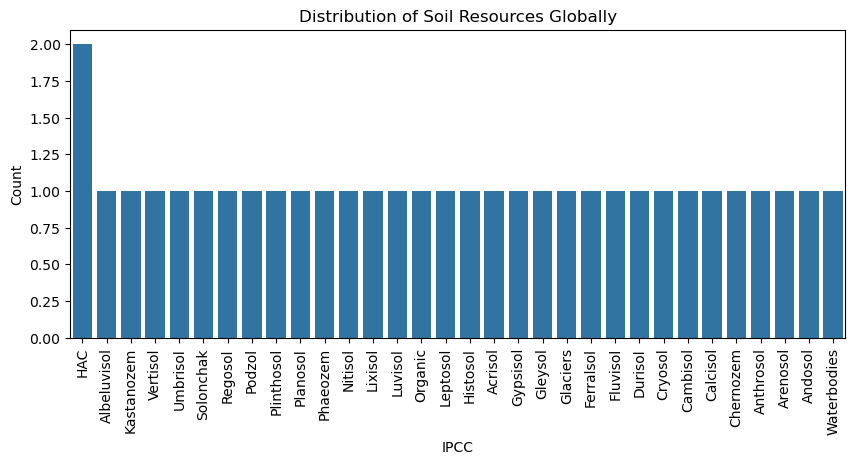

In [14]:
# Check distribution of soil resources (types) globally
plt.figure(figsize=(10, 4))
sns.countplot(x="IPCC",
              data=wrld_soil_bound_gdf,
              order=wrld_soil_bound_gdf["IPCC"].value_counts().index,
              color="#1f77b4")
plt.xticks(rotation=90)
plt.title("Distribution of Soil Resources Globally")
plt.xlabel("IPCC")
plt.ylabel("Count")

# Show the plot
plt.show()

**Observation**

HAC stands out as the more common soil resource.

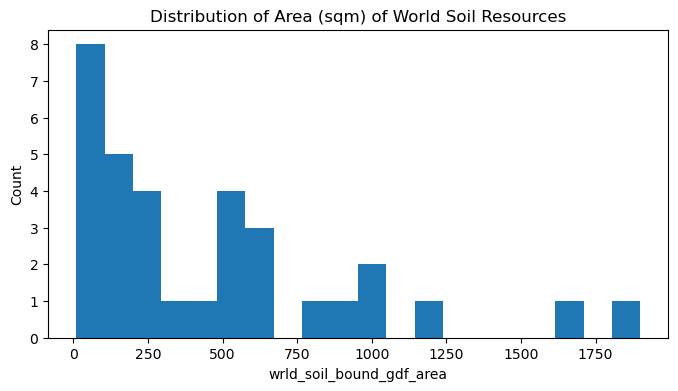

In [15]:
# Specify the integer variable you want to visualize
area = "wrld_soil_bound_gdf_area"

# Create a histogram for the integer variable
plt.figure(figsize=(8, 4))
plt.hist(data=wrld_soil_bound_gdf, x=area, color="#1f77b4", bins=20)
plt.title("Distribution of Area (sqm) of World Soil Resources")
plt.xlabel(area)
plt.ylabel("Count")

# Show the plot
plt.show()

**Observation**

The distribution of sqm area of the soil resources is skewed to the right.

    RELATIONSHIP ANALYSIS

- Which soil resouce occupies the largest area in sqm?

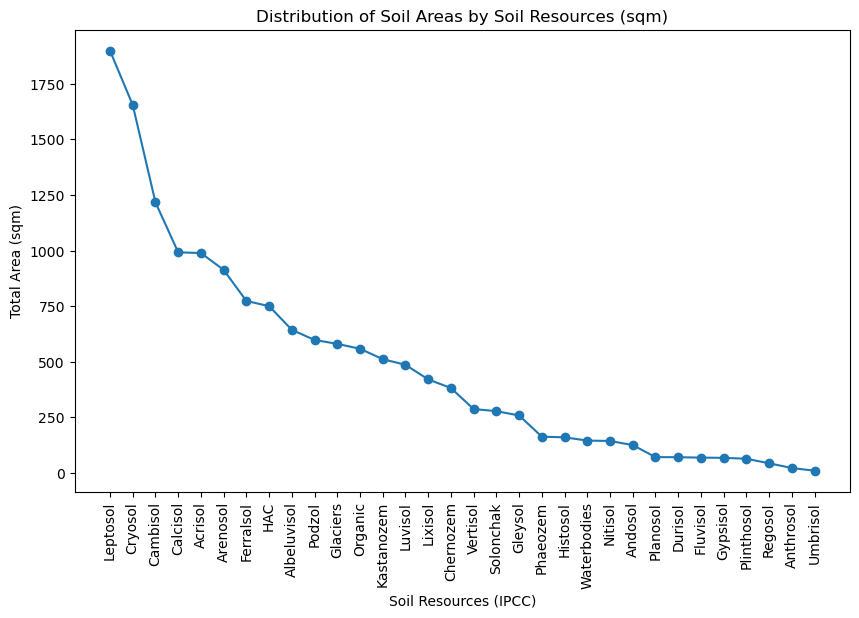

In [16]:
# Group the data by soil resources (types) and sum the areas
soil_type_areas = wrld_soil_bound_gdf.groupby("IPCC")["wrld_soil_bound_gdf_area"].sum().reset_index()

# Sort the data by soil area in descending order for line chart
soil_type_areas = soil_type_areas.sort_values(by="wrld_soil_bound_gdf_area", ascending=False)

# Create line chart
plt.figure(figsize=(10, 6))
plt.plot(soil_type_areas["IPCC"], soil_type_areas["wrld_soil_bound_gdf_area"], marker="o", color="#1f77b4", linestyle="-")
plt.xticks(rotation=90)
plt.title("Distribution of Soil Areas by Soil Resources (sqm)")
plt.xlabel("Soil Resources (IPCC)")
plt.ylabel("Total Area (sqm)")

# Show plot
plt.grid(False)
plt.show()

**Observation**

Leptsosol as a soil resource occupies the sqm area.

#### PROTECTED AREAS

    4.0 LOAD DATASET

In [17]:
# Load dataset to define world database of protected areas
wdpa = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\WDPA_WDOECM_wdpa_gdb_polygons\WDPA_WDOECM_wdpa_gdb_polygons.shx")

# Read the shapefile into geodataframe
protected_areas_gdf = gpd.read_file(wdpa)

In [18]:
protected_areas_gdf.head(2)

,WDPAID,WDPA_PID,PA_DEF,NAME,ORIG_NAME,DESIG,DESIG_ENG,DESIG_TYPE,IUCN_CAT,INT_CRIT,...,MANG_AUTH,MANG_PLAN,VERIF,METADATAID,SUB_LOC,PARENT_ISO,ISO3,SUPP_INFO,CONS_OBJ,geometry
0,10715.0,10715,1,Kronotskiy,Kronotskiy,UNESCO-MAB Biosphere Reserve,UNESCO-MAB Biosphere Reserve,International,Not Applicable,Not Applicable,...,Not Reported,Not Reported,State Verified,840,RU-KAM,RUS,RUS,Not Applicable,Not Applicable,"MULTIPOLYGON (((160.49655 55.17709, 160.49907 ..."
1,209777.0,209777_E,1,Sarali Land between Rivers / Great Volzhsko-Ka...,Great Volzhsko-Kamsky,UNESCO-MAB Biosphere Reserve,UNESCO-MAB Biosphere Reserve,International,Not Applicable,Not Applicable,...,Not Reported,Not Reported,State Verified,840,RU-TA,RUS,RUS,Not Applicable,Not Applicable,"POLYGON ((49.30487 55.36806, 49.30433 55.37184..."


    4.1 UNDERSTAND THE DATA

In [19]:
# Check no.of rows and columns for global protected areas dataframe
protected_areas_gdf.shape

(240165, 31)

The world protected areas dataframe has 240165 rows and 31 columns.

In [20]:
# Check column names of the global protected areas
protected_areas_gdf.columns

Index(['WDPAID', 'WDPA_PID', 'PA_DEF', 'NAME', 'ORIG_NAME', 'DESIG',
       'DESIG_ENG', 'DESIG_TYPE', 'IUCN_CAT', 'INT_CRIT', 'MARINE',
       'REP_M_AREA', 'GIS_M_AREA', 'REP_AREA', 'GIS_AREA', 'NO_TAKE',
       'NO_TK_AREA', 'STATUS', 'STATUS_YR', 'GOV_TYPE', 'OWN_TYPE',
       'MANG_AUTH', 'MANG_PLAN', 'VERIF', 'METADATAID', 'SUB_LOC',
       'PARENT_ISO', 'ISO3', 'SUPP_INFO', 'CONS_OBJ', 'geometry'],
      dtype='object')

The above shows the names of the columns

In [21]:
# Check the data-type of each column
protected_areas_gdf.dtypes

WDPAID         float64
WDPA_PID        object
PA_DEF          object
NAME            object
ORIG_NAME       object
DESIG           object
DESIG_ENG       object
DESIG_TYPE      object
IUCN_CAT        object
INT_CRIT        object
MARINE          object
REP_M_AREA     float64
GIS_M_AREA     float64
REP_AREA       float64
GIS_AREA       float64
NO_TAKE         object
NO_TK_AREA     float64
STATUS          object
STATUS_YR        int64
GOV_TYPE        object
OWN_TYPE        object
MANG_AUTH       object
MANG_PLAN       object
VERIF           object
METADATAID       int64
SUB_LOC         object
PARENT_ISO      object
ISO3            object
SUPP_INFO       object
CONS_OBJ        object
geometry      geometry
dtype: object

The above shows the data types for each column.

In [22]:
# Check for all the unique values in a particular column
protected_areas_gdf["OWN_TYPE"].unique()

array(['Not Reported', 'State', 'Communal', 'Contested',
       'Non-profit organisations', 'Multiple ownership',
       'Joint ownership', 'Individual landowners',
       'For-profit organisations'], dtype=object)

This shows the total no. of unique values in each column.

In [23]:
# Check for the unique values in each column
protected_areas_gdf.nunique()

WDPAID        239676
WDPA_PID      240165
PA_DEF             1
NAME          222450
ORIG_NAME     222524
DESIG           8812
DESIG_ENG       1500
DESIG_TYPE         4
IUCN_CAT          10
INT_CRIT         217
MARINE             2
REP_M_AREA      1967
GIS_M_AREA     17703
REP_AREA      158982
GIS_AREA      237680
NO_TAKE            6
NO_TK_AREA       306
STATUS             6
STATUS_YR        160
GOV_TYPE          12
OWN_TYPE           9
MANG_AUTH       5045
MANG_PLAN       3856
VERIF              3
METADATAID       295
SUB_LOC         2589
PARENT_ISO       205
ISO3             245
SUPP_INFO          1
CONS_OBJ           1
geometry       95892
dtype: int64

The analysis shows the total no. of unique values in each column of the dataframe.

In [24]:
# Check for unique value and their counts in relevant column
protected_areas_gdf["OWN_TYPE"].value_counts()

Not Reported                188413
State                        30822
Non-profit organisations      9325
Individual landowners         8144
Multiple ownership            2799
Communal                       444
Joint ownership                152
For-profit organisations        64
Contested                        2
Name: OWN_TYPE, dtype: int64

The analysis show the unique values and respective counts in the OWN_TYPE column for the dataframe.

In [25]:
# Check information about the dataframe
protected_areas_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 240165 entries, 0 to 240164
Data columns (total 31 columns):
 #   Column      Non-Null Count   Dtype   
---  ------      --------------   -----   
 0   WDPAID      240165 non-null  float64 
 1   WDPA_PID    240165 non-null  object  
 2   PA_DEF      240165 non-null  object  
 3   NAME        240165 non-null  object  
 4   ORIG_NAME   240165 non-null  object  
 5   DESIG       240165 non-null  object  
 6   DESIG_ENG   240165 non-null  object  
 7   DESIG_TYPE  240165 non-null  object  
 8   IUCN_CAT    240165 non-null  object  
 9   INT_CRIT    240165 non-null  object  
 10  MARINE      240165 non-null  object  
 11  REP_M_AREA  240165 non-null  float64 
 12  GIS_M_AREA  240165 non-null  float64 
 13  REP_AREA    240165 non-null  float64 
 14  GIS_AREA    240165 non-null  float64 
 15  NO_TAKE     240165 non-null  object  
 16  NO_TK_AREA  240165 non-null  float64 
 17  STATUS      240165 non-null  object  
 18  STATUS_YR   2401

This provides basic information about the dataframe. It contains categorical values, which are represented by columns with 'object' data types, numeric values, which are represented by columns with 'float64' data types and geometric data, which is stored in columns with 'geometry' data types. Geometric data represents spatial or geographic information.

In [26]:
# Check the coordinate system of the dataframe
protected_areas_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The Coordinate System of the dataframe is 4326, which is the WGS 84 Coordinate System.

In [27]:
# Check the geometric type of the dataframe
protected_areas_gdf.geom_type

0         MultiPolygon
1              Polygon
2              Polygon
3              Polygon
4              Polygon
              ...     
240160            None
240161            None
240162            None
240163            None
240164            None
Length: 240165, dtype: object

Not all records for the dataframe has the multipolyglon geometric type. While some do not contain geometric type, others are polyglon geometric type.

In [28]:
# Check for mean, standard deviation and the five summary of a numerical variable
protected_areas_gdf.describe()

,WDPAID,REP_M_AREA,GIS_M_AREA,REP_AREA,GIS_AREA,NO_TK_AREA,STATUS_YR,METADATAID
count,2.401650e+05,2.401650e+05,240165.000000,2.401650e+05,2.401650e+05,2.401650e+05,240165.000000,240165.000000
mean,2.948411e+08,1.052057e+01,9.635130,3.433475e+02,1.187799e+02,6.620989e+00,1782.491241,1806.917149
std,2.758856e+08,3.247187e+03,2020.674598,1.101636e+05,4.399445e+03,3.174890e+03,619.741029,228.477992
min,3.000000e+00,0.000000e+00,0.000000,0.000000e+00,5.592144e-09,0.000000e+00,0.000000,6.000000
25%,3.091490e+05,0.000000e+00,0.000000,5.000000e-02,5.438140e-02,0.000000e+00,1984.000000,1832.000000
50%,5.555196e+08,0.000000e+00,0.000000,4.200000e-01,4.510689e-01,0.000000e+00,2001.000000,1839.000000
75%,5.555980e+08,0.000000e+00,0.000000,3.827702e+00,4.144507e+00,0.000000e+00,2008.000000,1848.000000
max,5.557150e+08,1.555851e+06,973704.663971,5.394273e+07,1.521513e+06,1.555851e+06,2020.000000,1999.000000


This shows the count, mean, standard deviation, minimum and maximum values and the quantities of each quantitative column in the dataframe.

    4.2 EXPLORATORY DATA ANALYSIS

    UNIVARIATE ANALYSIS

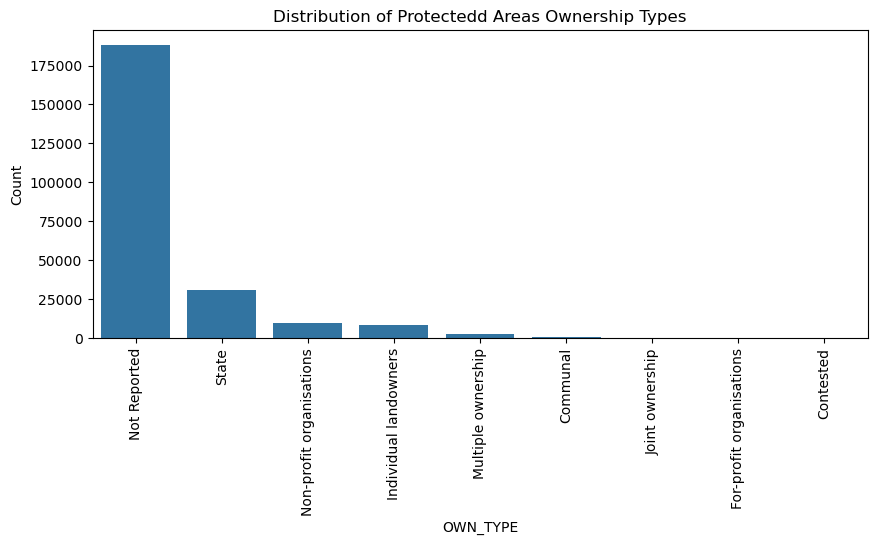

In [29]:
# Check distribution of ownership type of protected areas
plt.figure(figsize=(10, 4))
sns.countplot(x="OWN_TYPE",
              data=protected_areas_gdf,
              order=protected_areas_gdf["OWN_TYPE"].value_counts().index,
              color="#1f77b4")
plt.xticks(rotation=90)
plt.title("Distribution of Protectedd Areas Ownership Types")
plt.xlabel("OWN_TYPE")
plt.ylabel("Count")

plt.show()

**Observation**

A significant portion of global protected areas lack reported ownership structures. Meanwhile, contested ownership, the least common category, may arise from disputes or conflicts.

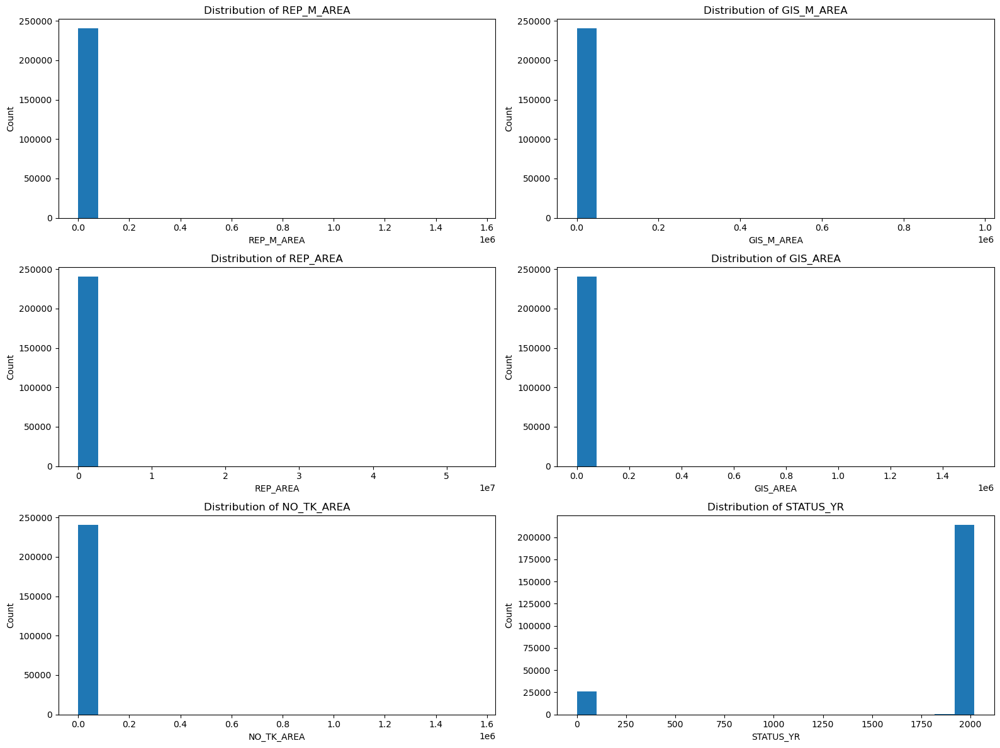

In [30]:
# Check distribution of float variables

# List of selected float variables 
float_variables = ["REP_M_AREA", "GIS_M_AREA", "REP_AREA", "GIS_AREA", "NO_TK_AREA", "STATUS_YR"]

# Calculate the number of rows and columns for the subplots
num_plots = len(float_variables)
num_cols = 2  # Number of columns for the subplots
num_rows = (num_plots + num_cols - 1) // num_cols  # Calculate the number of rows

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 12))

# Loop through the float variables and generate histograms in subplots
for i, variable in enumerate(float_variables):
    row_index = i // num_cols
    col_index = i % num_cols

    ax = axes[row_index, col_index]

    # Generate the histogram
    ax.hist(data=protected_areas_gdf, x=variable, color="#1f77b4", bins=20)
    ax.set_title(f"Distribution of {variable}")
    ax.set_xlabel(variable)
    ax.set_ylabel("Count")

# Adjust layout
plt.tight_layout()

# Show subplots
plt.show()

**Observation**

The distribution of the selected variables are all skewed to the right except the STATUS_YR variable

    RELATIONSHIP ANALYSIS

- What designation type has the largest sqkm area combined?

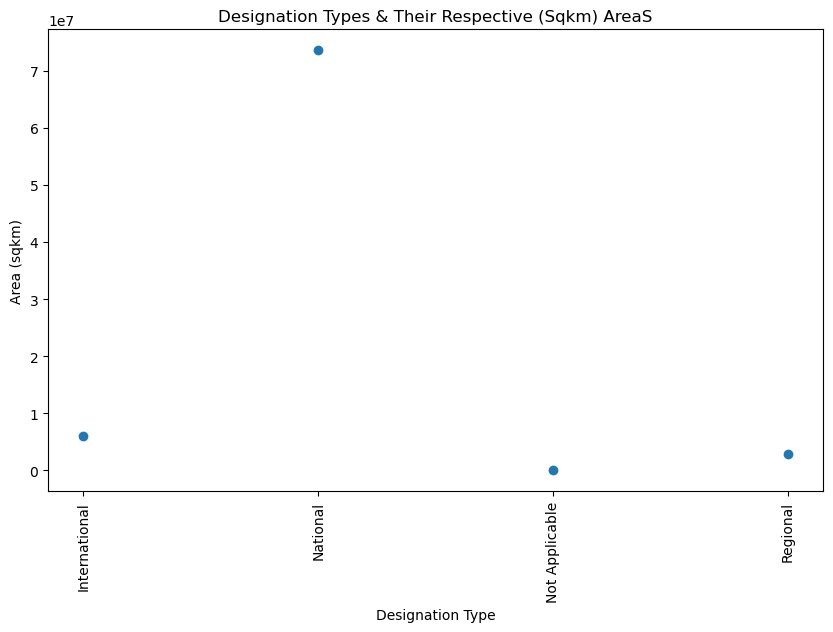

In [31]:
# Group the data by designation type and sum the areas
desig_type_areas = protected_areas_gdf.groupby("DESIG_TYPE")["REP_AREA"].sum().reset_index()

# Create scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(x=desig_type_areas["DESIG_TYPE"], y=desig_type_areas["REP_AREA"], color='#1f77b4', marker='o')
plt.xticks(rotation=90)
plt.title("Designation Types & Their Respective (Sqkm) AreaS")
plt.xlabel("Designation Type")
plt.ylabel("Area (sqkm)")

# Show the plot
plt.show()


**Observation**

Protected areas with national designations cover a substantial area in square kilometers, whereas areas without reported ownership represent the smallest portion.

C:\Users\User\AppData\Local\Temp\ipykernel_21900\3477006493.py:2: FutureWarning: The default value of numeric_only in GeoDataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = protected_areas_gdf.corr()


Text(0.0, 1.0, 'CORRELATIONS HEATMAP FOR GLOBAL PROTECTED AREAS DATASET')

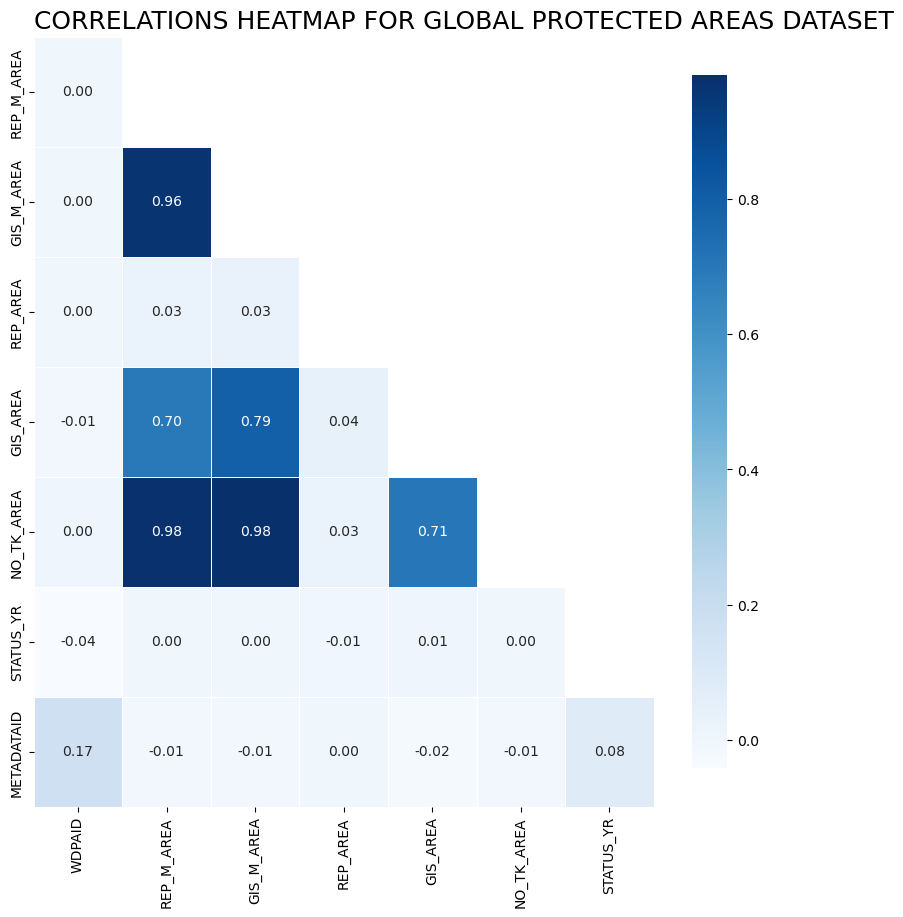

In [32]:
# Use heatmap to show graphical representation of the correlation between variables
corr = protected_areas_gdf.corr()
ones = np.ones_like(corr, dtype="bool")
mask = np.triu(ones)
mask = mask[1:, :-1]
corr = corr.iloc[1:,:-1].copy()
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap="Blues", linewidths=.6, cbar_kws={"shrink":.9})
ax.xaxis.tick_bottom()
plt.title("Correlations heatmap for global protected areas dataset".upper(), fontdict={"fontsize": 18}, loc="left")


**Observation**

There is a strong correlation between some key variables such as;

REP_M_AREA and NO_TK_AREA

REP_M_AREA and GIS_AREA

REP_M_AREA and GIS_M_AREA

GIS_M_AREA and NO_TAKE_AREA

GIS_M_AREA and GIS_AREA

GIS_AREA and NO_TAKE_AREA

#### ROADS

    5.0 LOAD DATASET

In [33]:
# Load dataset to define global roads open access
global_roads= (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\Global Roads Open Access Data Set_dissolved.json")

# Read the json into geodataframe
global_roads_gdf = gpd.read_file(global_roads)


    5.1 UNDERSTAND DATA

In [34]:
global_roads_gdf.head(2)

,OBJECTID,ONME,FCLASS,SRFTPE,ISSEASONAL,CURNTPRAC,GDWTHRPRAC,SUM_LENGTH_KM,geometry
0,1,NaN,0,0.0,0.0,NaN,NaN,16686.65607,"LINESTRING (-66.82451 17.98029, -66.82455 17.9..."
1,2,NaN,0,0.0,0.0,NaN,NaN,16686.65607,"LINESTRING (-66.62012 17.98131, -66.62126 17.9..."


In [35]:
# Check no.of rows and columns for global roads dataframe
global_roads_gdf.shape

(1101300, 9)

The global roads dataframe has 1101300 rows and 9 columns.

In [36]:
# Check column names of the globalroads
global_roads_gdf.columns

Index(['OBJECTID', 'ONME', 'FCLASS', 'SRFTPE', 'ISSEASONAL', 'CURNTPRAC',
       'GDWTHRPRAC', 'SUM_LENGTH_KM', 'geometry'],
      dtype='object')

The above shows the names of the columns

In [37]:
# Check the data-type of each column
global_roads_gdf.dtypes

OBJECTID            int64
ONME               object
FCLASS              int64
SRFTPE            float64
ISSEASONAL        float64
CURNTPRAC         float64
GDWTHRPRAC        float64
SUM_LENGTH_KM     float64
geometry         geometry
dtype: object

The above shows the data types for each column.

In [38]:
# Check for all the unique values in a particular column
global_roads_gdf["FCLASS"].unique()

array([0, 1, 2, 3, 4, 5, 6], dtype=int64)

This shows the total no. of unique values in each column.

In [39]:
# Check for the unique values in each column
global_roads_gdf.nunique()

OBJECTID         1101300
ONME                3669
FCLASS                 7
SRFTPE                 4
ISSEASONAL             3
CURNTPRAC              1
GDWTHRPRAC             1
SUM_LENGTH_KM       5037
geometry         1101290
dtype: int64

The analysis shows the total no. of unique values in each column of the dataframe.

In [40]:
# Check for unique value and their counts in relevant column
global_roads_gdf["FCLASS"].value_counts()

0    582993
5    186610
6    153883
3     98708
4     41773
2     32703
1      4630
Name: FCLASS, dtype: int64

The analysis show the unique values and respective counts in the FCLASS column for the dataframe.

In [41]:
# Check information about the dataframe
global_roads_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1101300 entries, 0 to 1101299
Data columns (total 9 columns):
 #   Column         Non-Null Count    Dtype   
---  ------         --------------    -----   
 0   OBJECTID       1101300 non-null  int64   
 1   ONME           997319 non-null   object  
 2   FCLASS         1101300 non-null  int64   
 3   SRFTPE         1083666 non-null  float64 
 4   ISSEASONAL     931397 non-null   float64 
 5   CURNTPRAC      845051 non-null   float64 
 6   GDWTHRPRAC     845051 non-null   float64 
 7   SUM_LENGTH_KM  1101300 non-null  float64 
 8   geometry       1101300 non-null  geometry
dtypes: float64(5), geometry(1), int64(2), object(1)
memory usage: 75.6+ MB


This provides basic information about the dataframe. It contains categorical values, which are represented by columns with 'object' data types, numeric values, which are represented by columns with 'float64' and 'int64' data types and geometric data, which is stored in columns with 'geometry' data types. Geometric data represents spatial or geographic information.

In [42]:
# Check the coordinate system of the dataframe
global_roads_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The Coordinate System of the dataframe is 4326, which is the WGS 84 Coordinate System.

In [43]:
# Check the geometric type of the dataframe
global_roads_gdf.geom_type

0          LineString
1          LineString
2          LineString
3          LineString
4          LineString
              ...    
1101295    LineString
1101296    LineString
1101297    LineString
1101298    LineString
1101299    LineString
Length: 1101300, dtype: object

All enteries for the dataframe has the linestring geometric type, indicating the geometries are represented as linear features.

In [44]:
# Check for mean, standard deviation and the five summary of a numerical variable
global_roads_gdf.describe()

,OBJECTID,FCLASS,SRFTPE,ISSEASONAL,CURNTPRAC,GDWTHRPRAC,SUM_LENGTH_KM
count,1.101300e+06,1.101300e+06,1.083666e+06,931397.000000,845051.0,845051.0,1.101300e+06
mean,5.506505e+05,2.169799e+00,1.302089e-01,0.160552,0.0,0.0,3.218170e+06
std,3.179181e+05,2.468778e+00,4.128083e-01,0.540086,0.0,0.0,2.908888e+06
min,1.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.0,0.0,3.317022e-03
25%,2.753258e+05,0.000000e+00,0.000000e+00,0.000000,0.0,0.0,1.545176e+05
50%,5.506505e+05,0.000000e+00,0.000000e+00,0.000000,0.0,0.0,6.113355e+06
75%,8.259752e+05,5.000000e+00,0.000000e+00,0.000000,0.0,0.0,6.113355e+06
max,1.101300e+06,6.000000e+00,3.000000e+00,2.000000,0.0,0.0,6.113355e+06


This shows the count, mean, standard deviation, minimum and maximum values and the quantities of each quantitative column in the dataframe.

    5.2 EXPLORATORY DATA ANALYSIS

    UNIVARIATE ANALYSIS

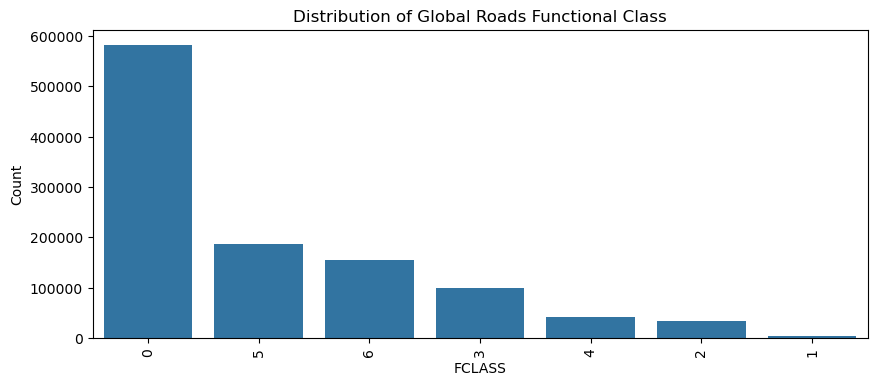

In [45]:
# Check distribution of functional type of the global roads
plt.figure(figsize=(10, 4))
sns.countplot(x="FCLASS",
              data=global_roads_gdf,
              order=global_roads_gdf["FCLASS"].value_counts().index,
              color="#1f77b4")
plt.xticks(rotation=90)
plt.title("Distribution of Global Roads Functional Class")
plt.xlabel("FCLASS")
plt.ylabel("Count")

plt.show()

**Observation**

The highest number of roads, indicated as 0 in the functional class, fall under the unspecified category.

    RELATIONSHIP ANALYSIS 

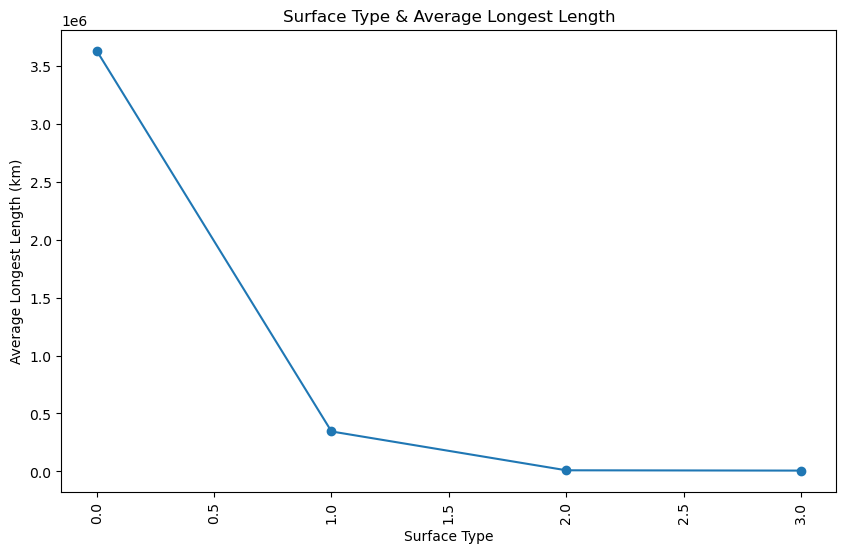

In [46]:
# Group the roads by surface type and calculate the mean length
srf_type_means = global_roads_gdf.groupby("SRFTPE")["SUM_LENGTH_KM"].mean().reset_index()

# Create a line plot with points to show the trend of average lengths by surface type
plt.figure(figsize=(10, 6))
plt.plot(srf_type_means["SRFTPE"], srf_type_means["SUM_LENGTH_KM"], marker="o", color="#1f77b4", linestyle="-")
plt.xticks(rotation=90)
plt.title("Surface Type & Average Longest Length")
plt.xlabel("Surface Type")
plt.ylabel("Average Longest Length (km)")

# Show plot
plt.show()


**Observation**

Surface types with an integer of 0.0 denote paved roads, exhibiting the highest average length in square kilometers. In contrast, those with an integer of 3.0, signifying dirt/sand roads, have the lowest average length.

C:\Users\User\AppData\Local\Temp\ipykernel_21900\1741488661.py:2: FutureWarning: The default value of numeric_only in GeoDataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = global_roads_gdf.corr()


Text(0.0, 1.0, 'CORRELATIONS HEATMAP FOR GLOBAL ROADS DATASET')

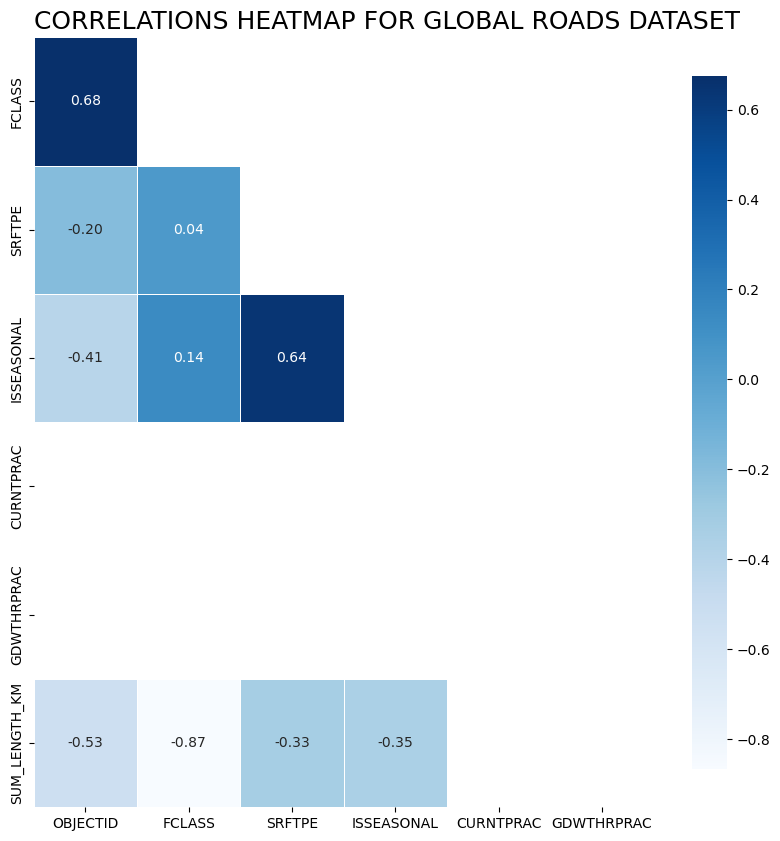

In [47]:
# Use heatmap to show graphical representation of the correlation between variables
corr = global_roads_gdf.corr()
ones = np.ones_like(corr, dtype="bool")
mask = np.triu(ones)
mask = mask[1:, :-1]
corr = corr.iloc[1:,:-1].copy()
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap="Blues", linewidths=.6, cbar_kws={"shrink":.9})
ax.xaxis.tick_bottom()
plt.title("Correlations heatmap for global roads dataset".upper(), fontdict={"fontsize": 18}, loc="left")


**Observation**

There is a strong correlation between some key variables such as;

OBJECT_ID and FCLASS

SRFTPE and ISSEASONAL

#### GEOSPATIAL ANALYSIS

    6.0 SOIL DISTRIBUTION ANALYSIS

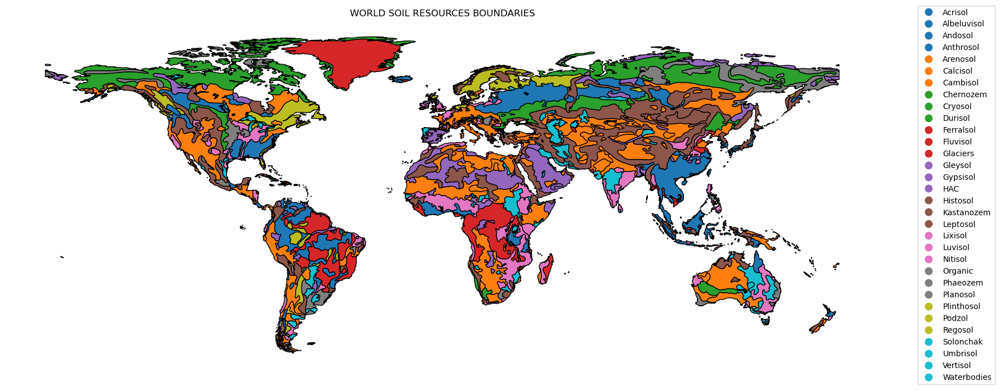

In [48]:
# Plot map showing the differnet world soil resources
fig, ax = plt.subplots(1, figsize=(20, 10))
wrld_soil_bound_gdf.plot(ax=ax, column="IPCC",legend=True, edgecolor="black", legend_kwds={"loc": "center left"})

# Add legend
leg = ax.get_legend()
leg.set_bbox_to_anchor((1.04, 0.5))

# Add title
plt.title("WORLD SOIL RESOURCES BOUNDARIES")

# Display plot
plt.axis("off")
plt.show()

In [49]:
# Create interactive map of the world soil resources bondaries
wrld_soil_bound_gdf.explore()

**Observation**

The analyses above show the geographic distribution of different soil types and their boundaries. This provide insights into which soil types are prevalent in specific regions. For example, HAC and ferralsol have a wide spread in Africa. While the Glaciers is predominant in Greenland (Denmark) & surrounded by cryosol at its boundary, which is a common soil type in areas with rivers of ice and ice sheets

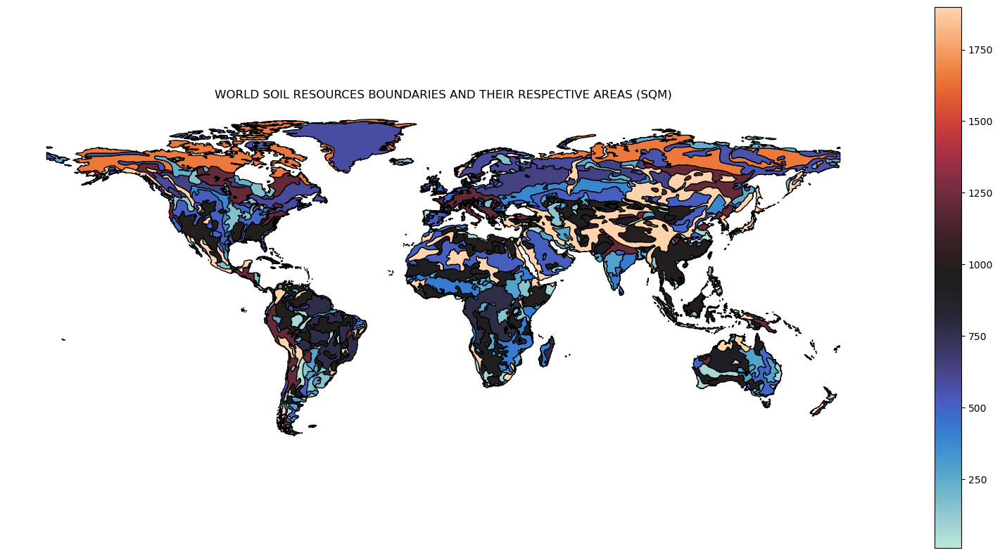

In [50]:
# Create a choropleth map based on the area column
wrld_soil_bound_gdf.plot(figsize=((20,10)), cmap="icefire", column="wrld_soil_bound_gdf_area", legend=True, edgecolor="black")

# Add title
plt.title("WORLD SOIL RESOURCES BOUNDARIES AND THEIR RESPECTIVE AREAS (SQM)")

# Display plot
plt.axis("off")
plt.show()


**Observation**

The choropleth map illustrates the spatial distribution of world soil resource boundaries, with varying colors indicating different area sizes. Larger areas, depicted by warmer colors, are notable in some regions, while smaller areas, represented by cooler colors, are found in other parts of the world.

    6.1 SOIL ECOSYSTEMS & SERVICES MAPPING

In [51]:
# Check ecosystem types within the soil resources (types) boundaries

# Define mappings of soil types to ecosystems
ecosystem_type = {
    "Histosol": ["Boreal Forest", "Tundra"],
    "Gypsisol": ["Desert", "Grassland", "Shrubland", "Chaparral", "Woodland"],
    "Durisol": ["Desert", "Grassland", "Shrubland", "Chaparral", "Woodland"],
    "Calcisol": ["Desert", "Grassland", "Shrubland", "Chaparral", "Woodland"],
    "Vertisol": ["Grassland", "Woodland", "Broad-leaf Evergreen Forest"],
    "Fluvisol": ["Grassland", "Woodland", "Broad-leaf Evergreen Forest"],
    "Regosol": ["Dry Conifer Forest", "Boreal Forest", "Alpine", "Tundra"],
    "Leptosol": ["Dry Conifer Forest", "Boreal Forest", "Alpine", "Tundra"],
    "Cambisol": ["Dry Conifer Forest", "Boreal Forest", "Alpine", "Tundra"],
    "Gleysol": ["Dry Conifer Forest", "Boreal Forest"],
    "Luvisol": ["Deciduous Forest", "Mixed Deciduous Forest", "Broadleaf Evergreen Forest"],
    "Planosol": ["Deciduous Forest", "Mixed Deciduous Forest", "Broadleaf Evergreen Forest"],
    "Albeluvisol": ["Deciduous Forest", "Mixed Deciduous Forest", "Broadleaf Evergreen Forest"],
    "Chernozem": ["Grassland", "Woodland"],
    "Kastanozem": ["Grassland", "Woodland"],
    "Phaeozem": ["Grassland", "Woodland"],
    "Podzol": ["Deciduous Forest", "Mixed Deciduous Forest", "Temperate Rain Forest"],
    "Cryosol": ["Alpine", "Tundra"],
    "Umbrisol": ["Deciduous Forest", "Mixed Deciduous Forest", "Temperate Rain Forest", "Broad-leaf Evergreen Forest"],
    "Andosol": ["Temperate Rain Forest", "Broad-leaf Evergreen Forest"],
    "Ferralsol": ["Tropical Forest"],
    "Acrisol": ["Tropical Forest"],
    "Nitisol": ["Tropical Forest"],
    "Lixisol": ["Tropical Forest"],
    "Waterbodies": ["Aquatic"],
    "Arenosol": ["Grassland", "Shrubland", "Savannah"],
    "Anthrosol": ["Human-influenced"],
    "Glaciers": ["Glacier"],
    "Plinthosol": ["Savannah", "Grassland"],
    "Solonchak": ["Grassland", "Shrubland"],
    "Organic": ["Boreal Forest"],
    "HAC": ["Combination"],
}

# Create a new column and categorize soil resources into different ecosystem types
wrld_soil_bound_gdf["ecosystem_type"] = "Unknown"

# Apply mappings based on soil type
for soil_type, ecosystem_types in ecosystem_type.items():
    wrld_soil_bound_gdf.loc[wrld_soil_bound_gdf["IPCC"] == soil_type, "ecosystem_type"] = ', '.join(ecosystem_types)

In [52]:
wrld_soil_bound_gdf.head(2)

,SNAME,IPCC,geometry,wrld_soil_bound_gdf_area,ecosystem_type
0,AB,Albeluvisol,"MULTIPOLYGON (((31.77594 49.15567, 31.98717 49...",643.427519,"Deciduous Forest, Mixed Deciduous Forest, Broa..."
1,AC,Acrisol,"MULTIPOLYGON (((116.05041 -2.90441, 116.04652 ...",988.700896,Tropical Forest


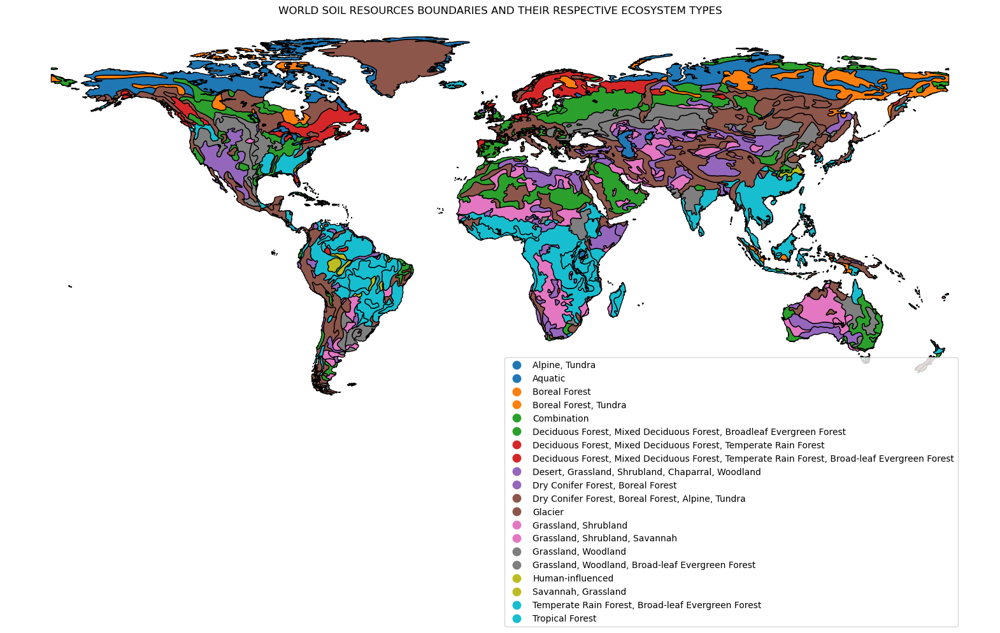

In [53]:
# Plot the differnet world soil resources within their respective boundaries and their ecosystem types
fig, ax = plt.subplots(1, figsize=(20, 15))
wrld_soil_bound_gdf.plot(ax=ax, column="ecosystem_type", legend=True, edgecolor="black", legend_kwds={"loc": "center left"})

# Add legend
leg = ax.get_legend()
leg.set_bbox_to_anchor((0.5, -0.2))

# Add title
plt.title("WORLD SOIL RESOURCES BOUNDARIES AND THEIR RESPECTIVE ECOSYSTEM TYPES")
plt.axis("off")
plt.show()

**Observation**

This showcases the boundaries of various ecosystem types, highlighting the transition zones between different ecosystems. These boundaries are essential for studying ecological interactions and managing protected areas. The tropical forest ecosystem type is dominant in Africa and South America.

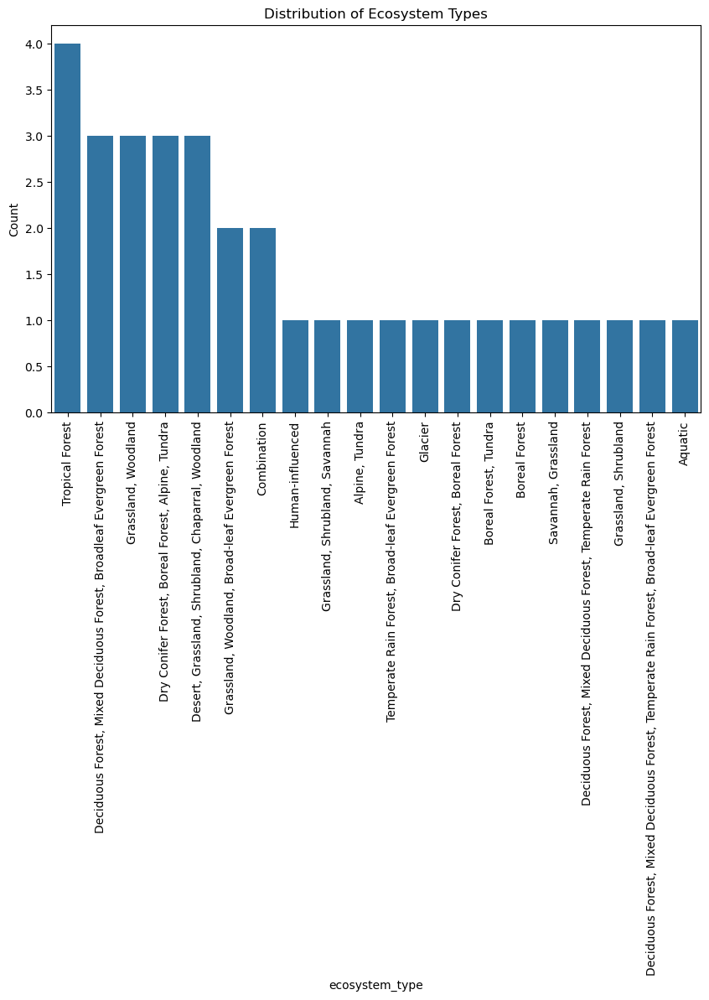

In [54]:
# Check distribution of ecosystem types
plt.figure(figsize=(10, 6))
sns.countplot(x="ecosystem_type",
              data=wrld_soil_bound_gdf,
              order=wrld_soil_bound_gdf["ecosystem_type"].value_counts().index,
              color="#1f77b4")
plt.xticks(rotation=90)
plt.title("Distribution of Ecosystem Types")
plt.xlabel("ecosystem_type")
plt.ylabel("Count")

# Display plot
plt.show()

**Observation**

The most prevalent ecosystem type is tropical forest, with the following categories closely following in prevalence: deciduous forest, mixed deciduous forest, broadleaf evergreen forest, grassland, woodland, dry conifer forest, boreal forest, alpine, tundra, desert, and shrubland, all of which share the same count.

Additionally, it's worth highlighting that among all the soil resources, anthrosol is distinctive for having a human-influenced ecosystem type.

In [55]:
# Check Major ecosystem service within the soil resources boundary

# Define mappings of soil types to major ecosystem services
major_ecosystem_service = {
    "Histosol": ["Climate Change"],
    "Gypsisol": ["Very few"],
    "Durisol": ["Very few"],
    "Calcisol": ["Very few"],
    "Vertisol": ["Food Security"],
    "Fluvisol": ["Food security"],
    "Regosol": ["Biomass"],
    "Leptosol": ["Water runoff"],
    "Cambisol": ["Food Security"],
    "Gleysol": ["Food Security"],
    "Luvisol": ["Food Security"],
    "Planosol": ["Very few"],
    "Albeluvisol": ["Very few"],
    "Chernozem": ["Food Security"],
    "Kastanozem": ["Food Security"],
    "Phaeozem": ["Food Security"],
    "Podzol": ["Biomass"],
    "Cryosol": ["Climate Change"],
    "Umbrisol": ["Water runoff"],
    "Andosol": ["Food Security"],
    "Ferralsol": ["Biomass"],
    "Acrisol": ["Food Security"],
    "Nitisol": ["Food Security"],
    "Lixisol": ["Food Security"],
    "Waterbodies": ["Water Provision", "Water Purification", "Flood Protection", "Coastal Protection", "Erosion Protection", "Recreation"],
    "Arenosol": ["Biomass"],
    "Anthrosol": ["Food Security"],
    "Glaciers": ["Climate Change"],
    "Plinthosol": ["Biomass"],
    "Solonchak": ["Very few"],
    "Organic": ["Food Security"],
    "HAC": ["Combination"],
}

# Create a new column and categorize soil resources into different ecosystem types
wrld_soil_bound_gdf["major_ecosystem_service"] = "Unknown"

# Apply mappings based on soil type
for soil_type, major_ecosystem_services in major_ecosystem_service.items():
    wrld_soil_bound_gdf.loc[wrld_soil_bound_gdf["IPCC"] == soil_type, "major_ecosystem_service"] = ', '.join(major_ecosystem_services)

In [56]:
wrld_soil_bound_gdf.head(2)

,SNAME,IPCC,geometry,wrld_soil_bound_gdf_area,ecosystem_type,major_ecosystem_service
0,AB,Albeluvisol,"MULTIPOLYGON (((31.77594 49.15567, 31.98717 49...",643.427519,"Deciduous Forest, Mixed Deciduous Forest, Broa...",Very few
1,AC,Acrisol,"MULTIPOLYGON (((116.05041 -2.90441, 116.04652 ...",988.700896,Tropical Forest,Food Security


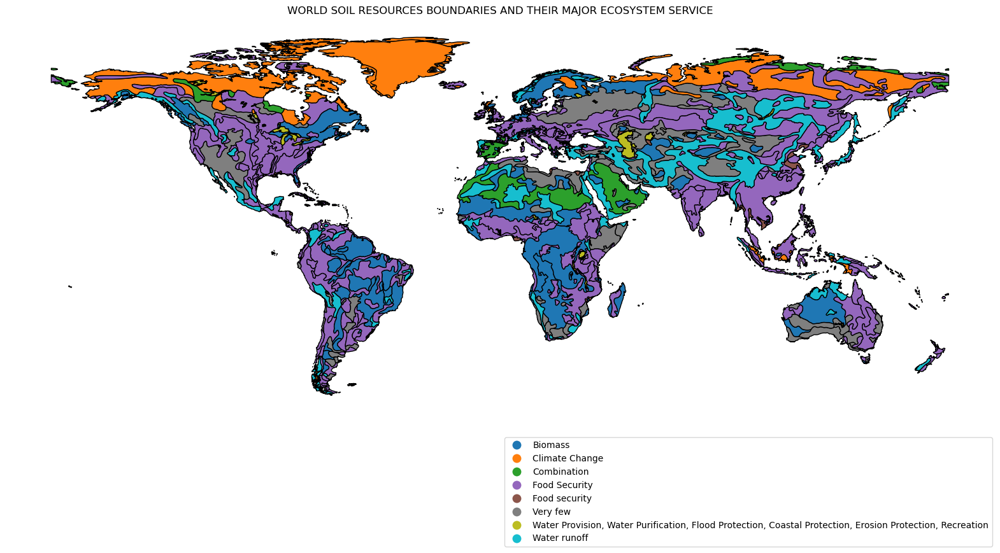

In [57]:
# Plot the differnet world soil resources within their respective boundaries and their major ecosystem service
fig, ax = plt.subplots(1, figsize=(20, 15))
wrld_soil_bound_gdf.plot(ax=ax, column="major_ecosystem_service", legend=True, edgecolor="black", legend_kwds={"loc": "center left"})

# Add legend
leg = ax.get_legend()
leg.set_bbox_to_anchor((0.5, -0.2))

# Add title
plt.title("WORLD SOIL RESOURCES BOUNDARIES AND THEIR MAJOR ECOSYSTEM SERVICE")

# Display plot
plt.axis("off")
plt.show()

**Observation**

Just as with the ecosystem type map, this map also illustrates the boundaries where different ecosystem services intersect. These services include processes and resources that are essential for human well-being.

    6.2 ROAD NETWORK ANALYSIS

In [58]:
# Create mappings for the following roads types & match them accordingly to their integer codes
mapping_global_roads_srftyp = {
    0: "Unspecified",
    1 : "Paved",
    2 : "Gravel",
    3 : "Dirt/Sand",
    4 : "Steel",
    5 : "Wood",
    6 : "Grass"
}

mapping_good_weather_road = {
    0: "Unspecified",
    1: "Non-motorized",
    2: "Motorbike",
    3: "4WD <3.5MT",
    4: "Light Truck <10MT",
    5: "Heavy Truck <20MT",
    6: "Truck + Trailer >20MT"
}

mapping_current_road = {
    0: "Unspecified",
    1: "Non-motorized",
    2: "Motorbike",
    3: "4WD <3.5MT",
    4: "Light Truck <10MT",
    5: "Heavy Truck <20MT",
    6: "Truck + Trailer >20MT"
}

mapping_seasonal = {
    0: "Unspecified",
    1: "Yes",
    2: "No"
}

mapping_global_roads_fclass = {
    0: "Unspecified",
    1 : "Highway",
    2 : "Primary",
    3 : "Secondary",
    4 : "Tertiary",
    5 : "Local/ Urban",
    6 : "Trail"
}


In [59]:
# Apply the mappings to the respective columns
global_roads_gdf["SRFTPE"] = global_roads_gdf["SRFTPE"].replace(mapping_global_roads_srftyp)
global_roads_gdf["GDWTHRPRAC"] = global_roads_gdf["GDWTHRPRAC"].replace(mapping_good_weather_road)
global_roads_gdf["CURNTPRAC"] = global_roads_gdf["CURNTPRAC"].replace(mapping_current_road)
global_roads_gdf["ISSEASONAL"] = global_roads_gdf["ISSEASONAL"].replace(mapping_seasonal)
global_roads_gdf["FCLASS"] = global_roads_gdf["FCLASS"].replace(mapping_global_roads_fclass)

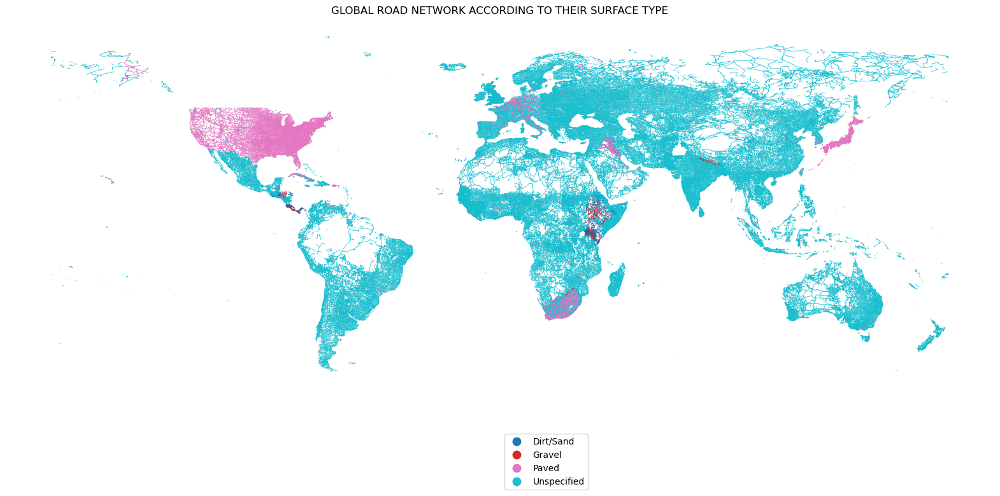

In [60]:
# Plot the global roads according to their surface type
fig, ax = plt.subplots(1, figsize=(20, 15))
global_roads_gdf.plot(ax=ax, column="SRFTPE", legend=True, linewidth=0.5, legend_kwds={"loc": "center left"})

# Add legend
leg = ax.get_legend()
leg.set_bbox_to_anchor((0.5, -0.2))

# Add title
plt.title("GLOBAL ROAD NETWORK ACCORDING TO THEIR SURFACE TYPE")

# Display plot
plt.axis("off")
plt.show()

**Observsation**

There is a large number of unspecified road based on surface types globally. Although a large portion of paved road types exist in North America. There is also a cluster of dirt/sand roads, paved roads, gravel roads and unspecified road roads in East Africa. 
Decision-makers can use this information for infrastructure planning and development. Areas with underdeveloped road networks or less durable surface types may require more investment.

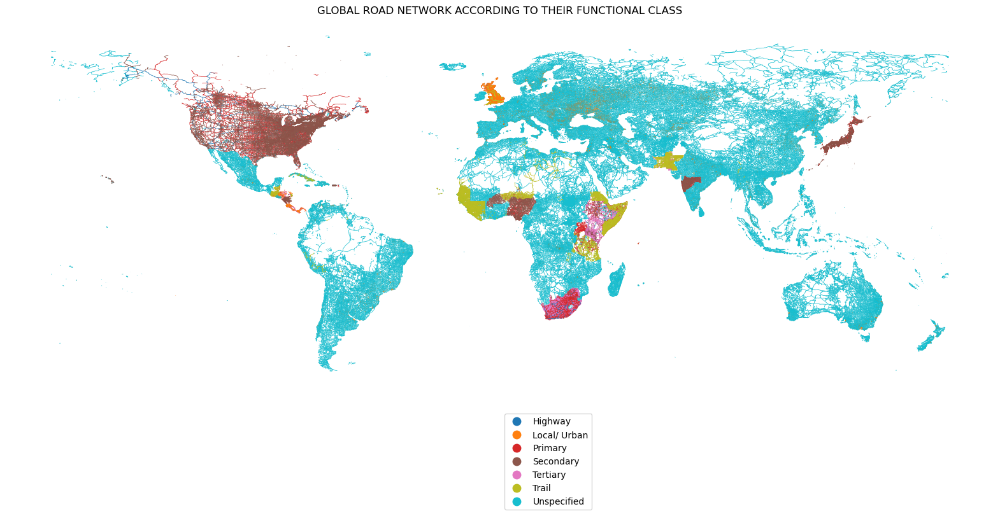

In [61]:
# Plot the global roads according to their functional class
fig, ax = plt.subplots(1, figsize=(20, 15))
global_roads_gdf.plot(ax=ax, column="FCLASS", legend=True, linewidth=0.5, legend_kwds={"loc": "center left"})

# Add legend
leg = ax.get_legend()
leg.set_bbox_to_anchor((0.5, -0.2))

# Add title
plt.title("GLOBAL ROAD NETWORK ACCORDING TO THEIR FUNCTIONAL CLASS")

# Display plot
plt.axis("off")
plt.show()

**Observation & Analysis**

The analysis of global road data by functional class reveals interesting regional patterns. While a substantial number of roads are labeled as "unspecified" in their functional class, certain trends emerge, Canada has a notable concentration of secondary roads. East African countries, including Kenya, Somalia, and Tanzania, predominantly feature trail road types. Meanwhile, West African nations like Senegal and Sierra Leone also exhibit a prevalence of trail roads.

In Asia, Pakistan also features a significant number of trail roads. The United Kingdom shows a preponderance of local/urban road types, reflecting the urbanized nature of the country. 

    6.3 SPATIAL ANALYSIS

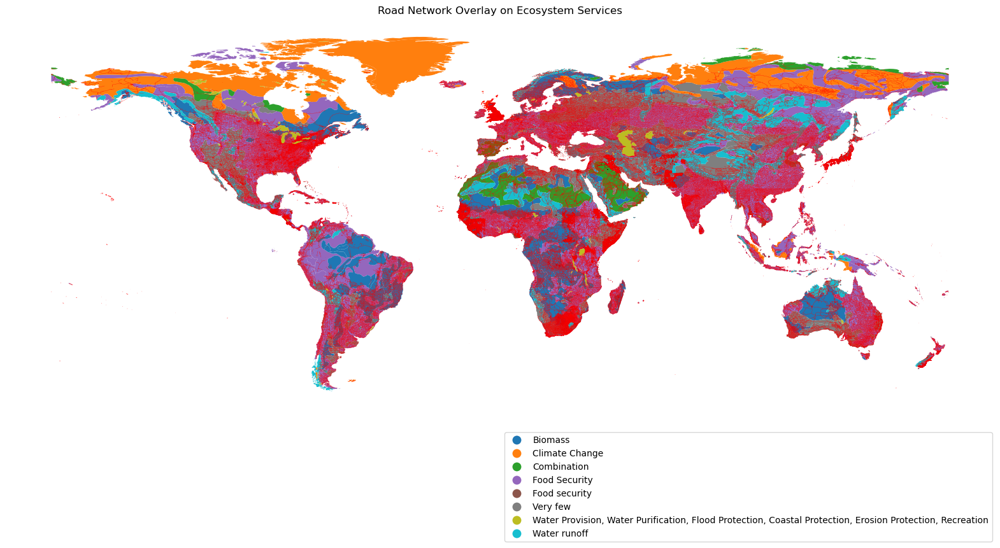

In [62]:
# create an overlay of road network on major ecosytem services of soil resources
fig, ax = plt.subplots(1, figsize=(20, 15))

# Plot soil boundary
wrld_soil_bound_gdf.plot(column="major_ecosystem_service", ax=ax, legend=True, legend_kwds={"loc": "center left"})

# Overlay the global rooads
global_roads_gdf.plot(ax=ax, facecolor="none", edgecolor="red", linewidth=0.2, label="Road Network")

# Add legend
leg = ax.get_legend()
leg.set_bbox_to_anchor((0.5, -0.2))

# Add title
plt.title("Road Network Overlay on Ecosystem Services")

# Display plot
plt.axis("off")
plt.show()

**Observation**

The red road network overlay suggests that roads crisscross areas with varying ecosystem services. Ecosystem types that provide climate change services have very little road networks.

#### SUMMARY & KEY FINDINGS

This analysis delves into a comprehensive dataset associated with the administrative land sector. It encompasses information regarding the world's soil boundaries, global protected areas, and the expansive global road network. This dataset comprises diverse subcategories, providing insights into a myriad of attributes.

Among the soil resources in this dataset, "High Activity Clay Soils" (HAC) take center stage. These soils are characterized by their prevalence of 2:1 silicate clay minerals, and they span various soil types. The analysis underscores their abundance and their distinctive role within the dataset.

Within the dataset of protected areas, there exist 188,413 globally recognized designations. Notably, a significant portion of these areas lacks reported ownership structures. Furthermore, two contested protected areas are identified, likely stemming from disputes or conflicts. These discoveries underscore the importance of more comprehensive reporting and the need for improved management of protected areas.

A fascinating tapestry of patterns emerges from the analysis of the global road network. A notable portion of roads is classified as "unspecified" in terms of their functional class, emphasizing the necessity for enhanced classification and data reporting. Paved road types prominently feature in North America, while East Africa boasts a diverse array of road types, encompassing dirt/sand roads, paved roads, gravel roads, and unspecified roads. These regional variations in road types reflect the diverse infrastructure and transportation requirements across various global regions.

The ecosystem services analysis establishes connections between soil types and major ecosystem services, offering valuable insights into the ecological roles played by different soil varieties. Ecosystem types exhibit extensive diversity, with tropical forest ecosystems prevailing in regions like Africa and South America. An exceptional inclusion among the soil resources is "Anthrosol," notable for its human-influenced ecosystem type.

The boundary information within the world soil resources dataset unveils the intersections of different ecosystem types and services. These boundaries serve as essential components for examining ecological interactions and facilitating effective management of protected areas. This understanding can guide decision-makers in ecological planning and resource management.

Soils categorized under various types play pivotal roles in climate change services. "Glaciers" stand out as significant contributors to climate change and exhibit distinct characteristics, particularly in Greenland, surrounded by "Cryosol."

The analysis of road networks and ecosystem services pinpoints regions with underdeveloped road infrastructure or surfaces of lesser durability. This valuable insight can steer the planning and development of infrastructure, ensuring that regions with specific transportation needs receive the requisite investment.

Collectively, these key findings provide a comprehensive comprehension of the dataset's elements and their far-reaching implications. They illuminate the intricate interplay between soil types, ecosystem services, protected areas, and road networks on a global scale. These insights have the potential to inform diverse domains, encompassing environmental management, infrastructure planning, and ecological research.

#### REFERENCES

[Organic Soils](https://www.sciencedirect.com/topics/agricultural-and-biological-sciences/organic-soils)

[Quantifying the Ecosystem Services of Glaciers Highlights Their Importance to Humankind](https://news.climate.columbia.edu/2021/09/17/quantifying-the-ecosystem-services-of-glaciers-highlights-their-importance-to-humankind/#:~:text=The%20benefits%20detailed%20in%20the,aspects%20of%20glaciers%2C%20albeit%20briefly.)

[Glaciers Ecosystem](https://www.antarcticglaciers.org/glacier-processes/glacier-ecosystems/#:~:text=Indeed%2C%20since%20glaciers%20and%20ice,form%20a%20distinct%20biome3.)

[Acquatic Ecosystems](https://joint-research-centre.ec.europa.eu/jrc-news-and-updates/aquatic-ecosystems-good-conditions-yield-better-services-2019-04-11_en#:~:text=Importance%20of%20aquatic%20ecosystem%20services&text=These%20include%20water%20provisioning%20(supply,against%20the%20sea)%20and%20recreation.)

[Major Soil Resources of The World](https://www.isric.org/sites/default/files/major_soils_of_the_world/set9/ab/albeluvi.pdf)

[World Soil Resources- FAO](https://www.fao.org/3/i5199e/i5199e.pdf)

[Soil Classification System](https://www.eolss.net/sample-chapters/c19/e1-05-07-11.pdf)

[Reference Base for Soil Resources](https://www.sciencedirect.com/topics/agricultural-and-biological-sciences/world-reference-base-for-soil-resources)

[HAC Soil Classification - FAO](https://www.fao.org/3/j2132s/J2132S22.htm)

[Global Roads Documentation](https://sedac.ciesin.columbia.edu/downloads/docs/groads/groads-v1-documentation.pdf)